In [1]:
import os
import torch
import torch.nn as nn
import torch.utils as utils
import torch.nn.init as init
import torchvision.utils as v_utils
import torchvision.datasets as dset
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict

In [2]:
epoch=50
batch_size=512
learning_rate=0.0002
num_gpus=1

In [3]:
mnist_train=dset.MNIST("./",train=True, transform=transforms.ToTensor(),target_transform=None,download=True)

100%|██████████| 9912422/9912422 [00:00<00:00, 128573274.67it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 29719257.56it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 32072806.77it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 21453298.16it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [4]:
train_loader=torch.utils.data.DataLoader(mnist_train,batch_size=batch_size,shuffle=True,num_workers=2,drop_last=True)

In [5]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator,self).__init__()
    self.layer1=nn.Sequential(
        nn.Linear(100,7*7*256),
        nn.BatchNorm1d(7*7*256),
        nn.ReLU(),
    )
    self.layer2=nn.Sequential(OrderedDict([
        ('conv1',nn.ConvTranspose2d(256,128,kernel_size=4,stride=2,padding=1)),
        ('bn1',nn.BatchNorm2d(128)),
        ('relu1',nn.ReLU()),
        ('conv2',nn.ConvTranspose2d(128,64,kernel_size=3,stride=1,padding=1)),
        ('bn2',nn.BatchNorm2d(64)),
        ('relu2',nn.ReLU()),
    ]))
    self.layer3=nn.Sequential(OrderedDict([
        ('conv3',nn.ConvTranspose2d(64,16,kernel_size=4,stride=2,padding=1)),
        ('bn3',nn.BatchNorm2d(16)),
        ('relu3',nn.ReLU()),
        ('conv4',nn.Conv2d(16,1,kernel_size=3,stride=1,padding=1)),
        ('relu4',nn.Tanh()),
    ]))
    for m in self.modules():
      if isinstance(m,nn.Conv2d):
        init.kaiming_normal_(m.weight.data)
        m.bias.data.fill_(0)
      elif isinstance(m,nn.Linear):
        init.kaiming_normal_(m.weight.data)
        m.bias.data.fill_(0)
  def forward(self, z):
        out=self.layer1(z)
        out = out.view(batch_size, 256, 7, 7)
        out=self.layer2(out)
        out=self.layer3(out)
        return out

In [6]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator,self).__init__()

    self.layer1=nn.Sequential(OrderedDict([
        ('conv1',nn.Conv2d(1,8,kernel_size=3,stride=1,padding=1)),
        #('bn1',nn.BatchNorm2d(8)),
        ('relu1',nn.LeakyReLU()),
        ('conv2',nn.Conv2d(8,16,kernel_size=3,stride=2,padding=1)),
        ('bn2',nn.BatchNorm2d(16)),
        ('relu2',nn.LeakyReLU()),
    ]))
    self.layer2=nn.Sequential(OrderedDict([
        ('conv3',nn.Conv2d(16,32,kernel_size=3,stride=1,padding=1)),
        ('bn3',nn.BatchNorm2d(32)),
        ('relu3',nn.LeakyReLU()),
        ('conv4',nn.Conv2d(32,64,kernel_size=3,stride=2,padding=1)),
        ('bn4',nn.BatchNorm2d(64)),
        ('relu4',nn.LeakyReLU()),
    ]))
    self.fc=nn.Sequential(
        nn.Linear(64*7*7,1),
        nn.Sigmoid()
    )
    for m in self.modules():
      if isinstance(m,nn.Conv2d):
        init.kaiming_normal_(m.weight.data)
        m.bias.data.fill_(0)
      elif isinstance(m,nn.Linear):
        init.kaiming_normal_(m.weight.data)
        m.bias.data.fill_(0)
  def forward(self, x):
        out=self.layer1(x)
        out=self.layer2(out)
        out = out.view(batch_size, -1)

        out=self.fc(out)
        return out

In [7]:
device=torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

generator=Generator().to(device)
discriminator=Discriminator().to(device)

cuda


In [8]:
gen_params=generator.state_dict().keys()
dis_params=discriminator.state_dict().keys()

for i in gen_params:
  print(i)

layer1.0.weight
layer1.0.bias
layer1.1.weight
layer1.1.bias
layer1.1.running_mean
layer1.1.running_var
layer1.1.num_batches_tracked
layer2.conv1.weight
layer2.conv1.bias
layer2.bn1.weight
layer2.bn1.bias
layer2.bn1.running_mean
layer2.bn1.running_var
layer2.bn1.num_batches_tracked
layer2.conv2.weight
layer2.conv2.bias
layer2.bn2.weight
layer2.bn2.bias
layer2.bn2.running_mean
layer2.bn2.running_var
layer2.bn2.num_batches_tracked
layer3.conv3.weight
layer3.conv3.bias
layer3.bn3.weight
layer3.bn3.bias
layer3.bn3.running_mean
layer3.bn3.running_var
layer3.bn3.num_batches_tracked
layer3.conv4.weight
layer3.conv4.bias


In [9]:
loss_func=nn.MSELoss()
gen_optim=torch.optim.Adam(generator.parameters(),lr=learning_rate,betas=(0.5,0.999))
dis_optim=torch.optim.Adam(discriminator.parameters(),lr=learning_rate,betas=(0.5,0.999))

ones_label=torch.ones(batch_size,1).to(device)
zeros_label=torch.zeros(batch_size,1).to(device)

In [10]:
for i in range(epoch):
  for j ,(image,label) in enumerate(train_loader):
    image=image.to(device)

    gen_optim.zero_grad()

    z=init.normal_(torch.Tensor(batch_size,100),mean=0,std=0.1).to(device)
    gen_fake=generator.forward(z)
    dis_fake=discriminator.forward(gen_fake)

    gen_loss=torch.sum(loss_func(dis_fake,ones_label))
    gen_loss.backward()
    gen_optim.step()

    dis_optim.zero_grad()

    z=init.normal_(torch.Tensor(batch_size,100),mean=0,std=0.1).to(device)
    gen_fake=generator.forward(z)
    dis_fake=discriminator.forward(gen_fake)

    dis_real=discriminator.forward(image)

    dis_loss=torch.sum(loss_func(dis_fake,zeros_label))+torch.sum(loss_func(dis_real,ones_label))
    dis_loss.backward()
    gen_optim.step()

    if j % 1000==0:
      torch.save([generator,discriminator],'./dcgan.pkl')
      print("{}th iteration gen_loss:{} dis_loss:{}".format(i,gen_loss.data,dis_loss.data))
      v_utils.save_image(gen_fake.cpu().data[0:25],"./gen_{}_{}.png".format(i,j),nrow=5)

0th iteration gen_loss:0.11429215967655182 dis_loss:0.7716253399848938
1th iteration gen_loss:0.11114172637462616 dis_loss:0.5821826457977295
2th iteration gen_loss:0.11133857071399689 dis_loss:0.571868896484375
3th iteration gen_loss:0.11038212478160858 dis_loss:0.5764503479003906
4th iteration gen_loss:0.11064760386943817 dis_loss:0.5851460695266724
5th iteration gen_loss:0.11057431250810623 dis_loss:0.5787830948829651
6th iteration gen_loss:0.11058119684457779 dis_loss:0.5754806995391846
7th iteration gen_loss:0.11130031198263168 dis_loss:0.5729899406433105
8th iteration gen_loss:0.11126361787319183 dis_loss:0.5736888647079468
9th iteration gen_loss:0.1106257364153862 dis_loss:0.5783065557479858
10th iteration gen_loss:0.11104053258895874 dis_loss:0.5763579607009888
11th iteration gen_loss:0.11102091521024704 dis_loss:0.57740318775177
12th iteration gen_loss:0.11130045354366302 dis_loss:0.5748416185379028
13th iteration gen_loss:0.11119899153709412 dis_loss:0.5772131681442261
14th i

0


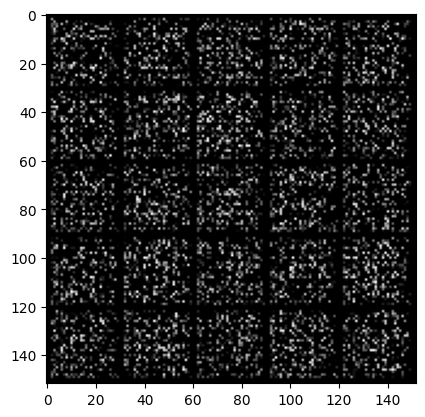

1


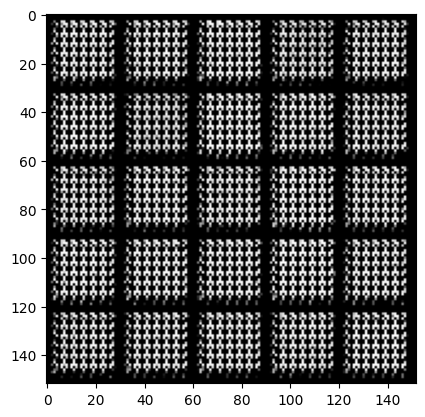

2


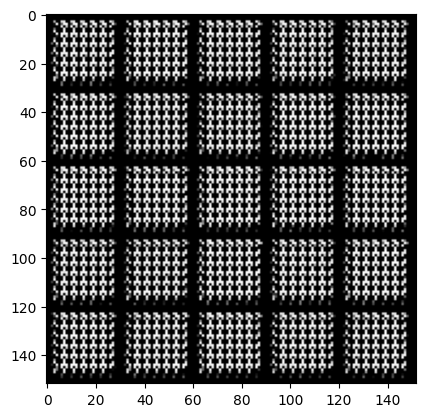

3


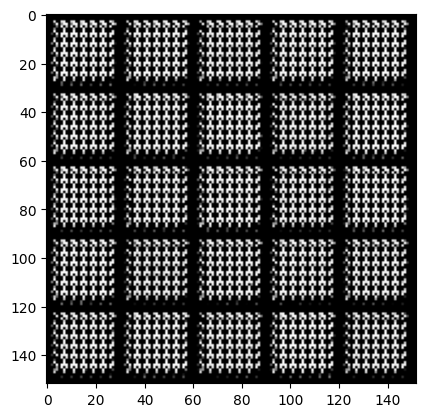

4


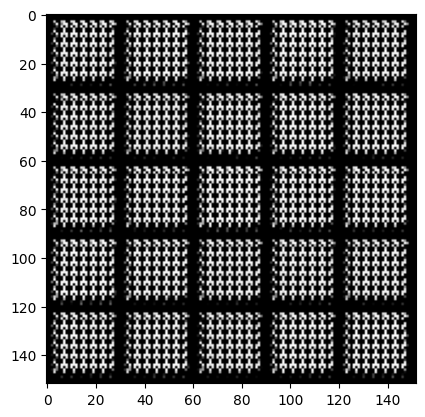

5


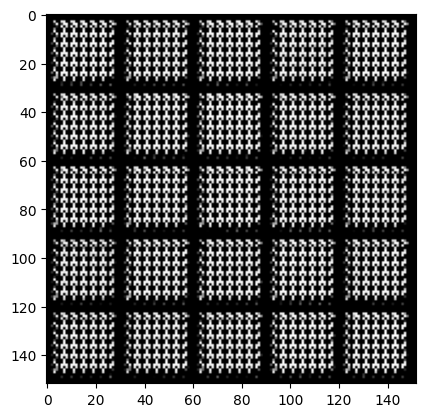

6


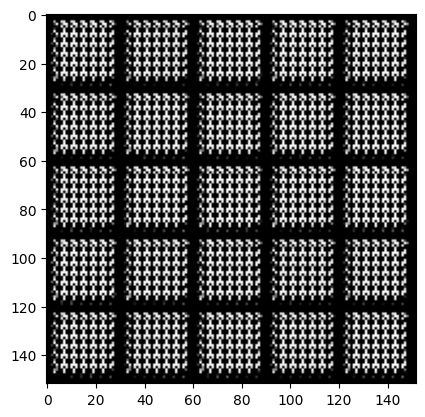

7


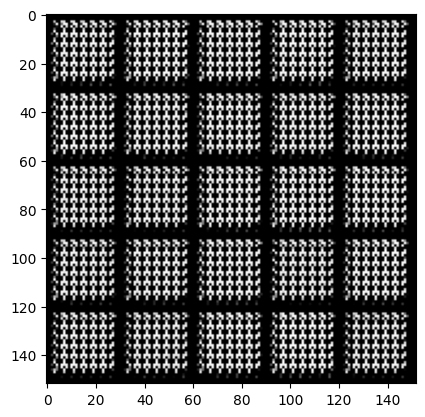

8


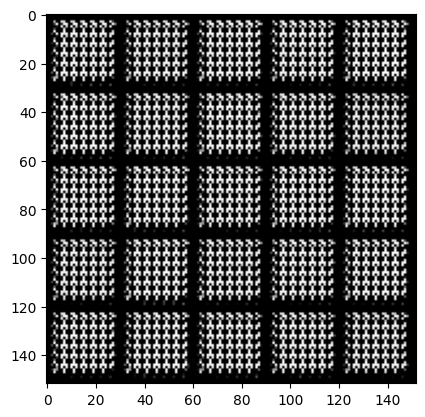

9


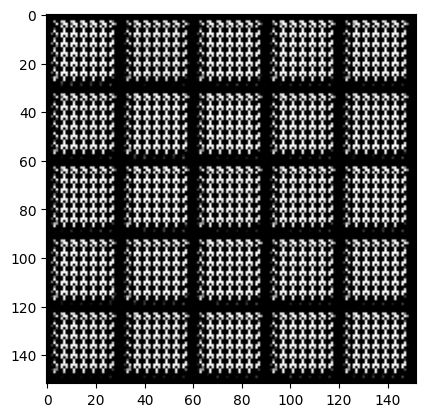

10


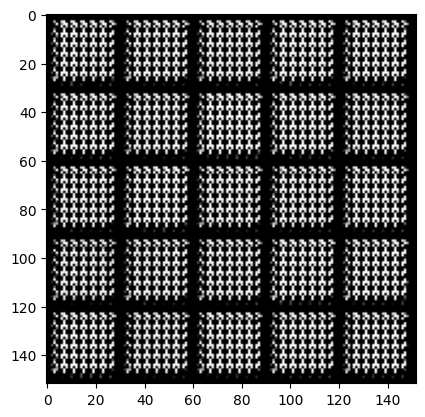

11


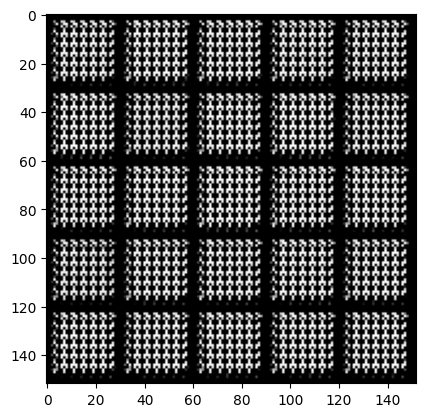

12


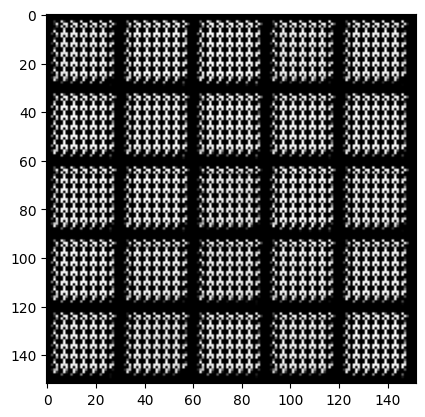

13


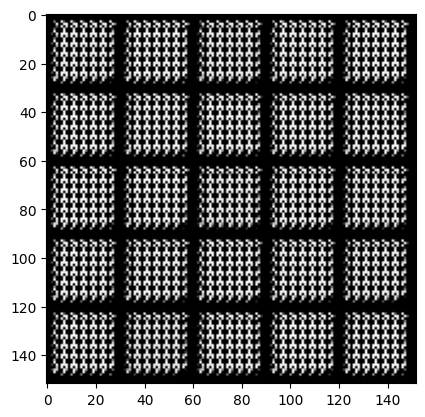

14


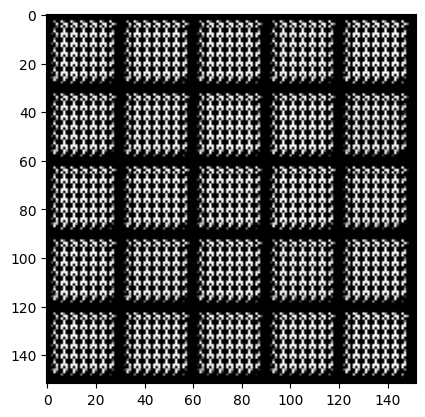

15


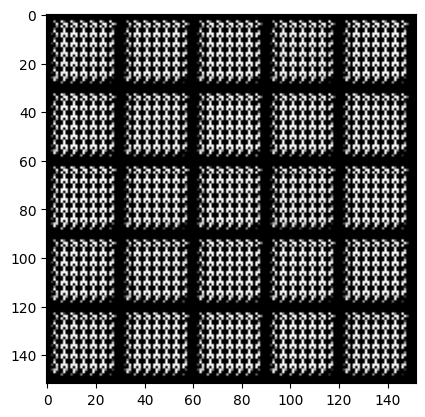

16


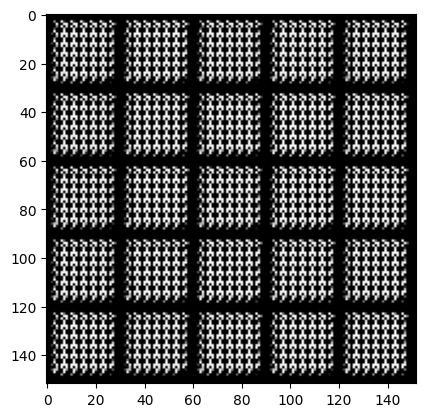

17


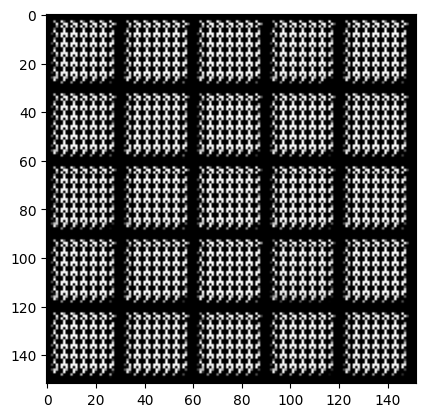

18


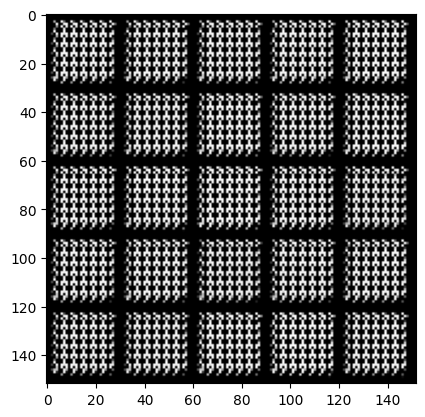

19


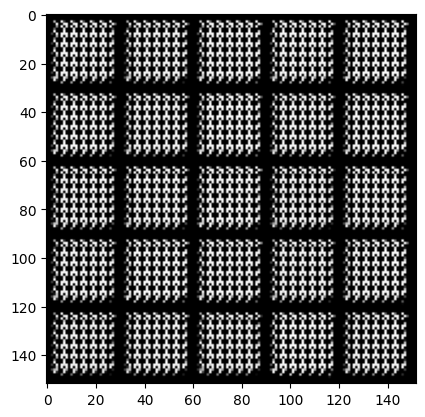

20


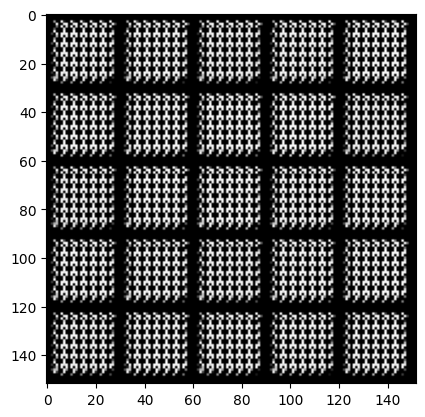

21


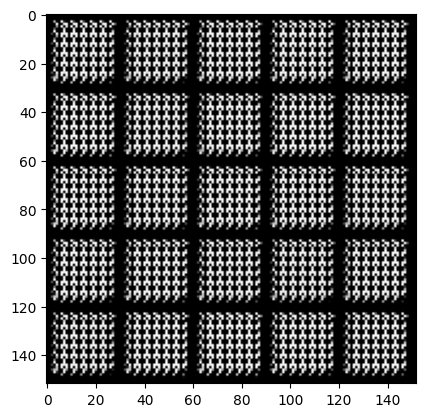

22


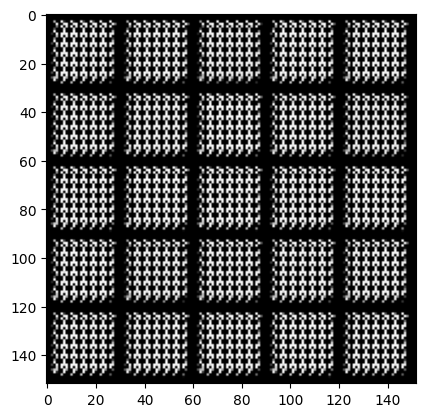

23


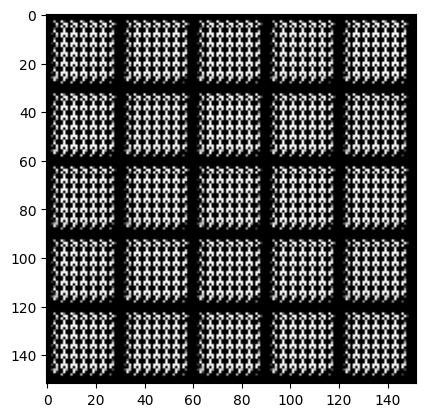

24


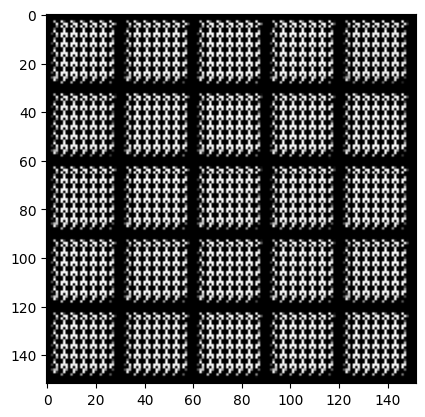

25


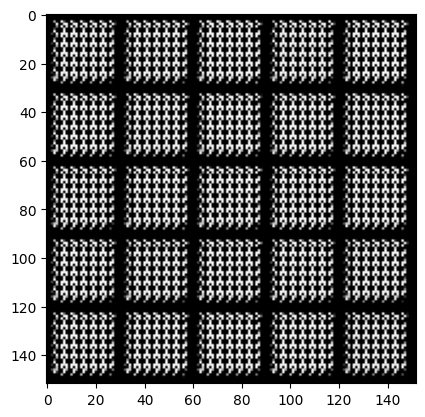

26


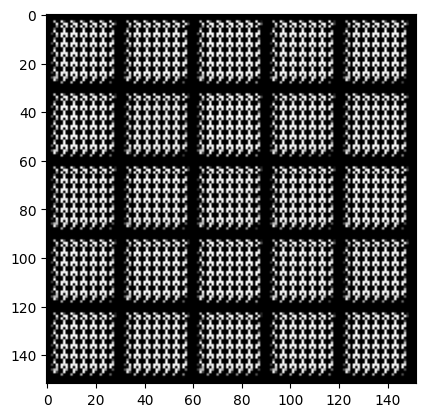

27


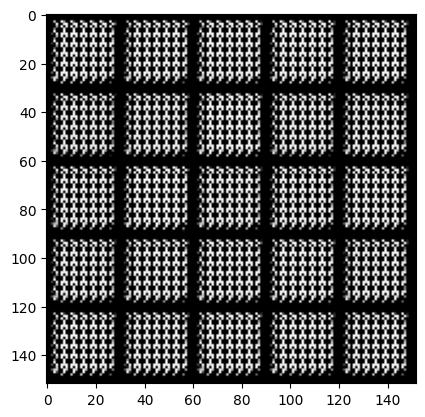

28


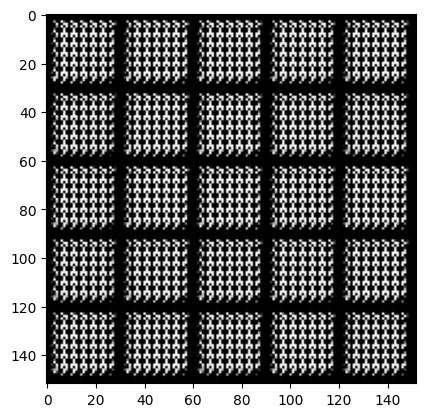

29


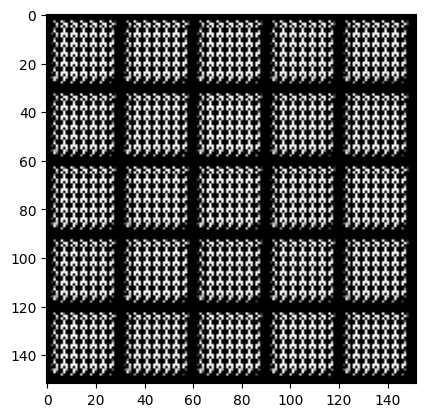

30


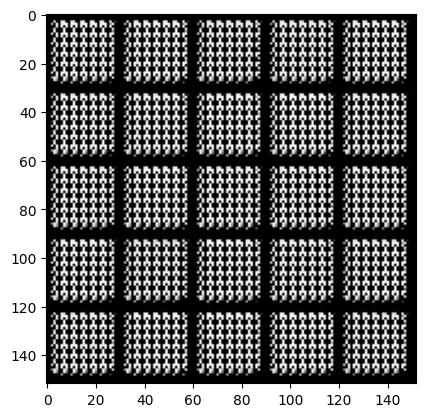

31


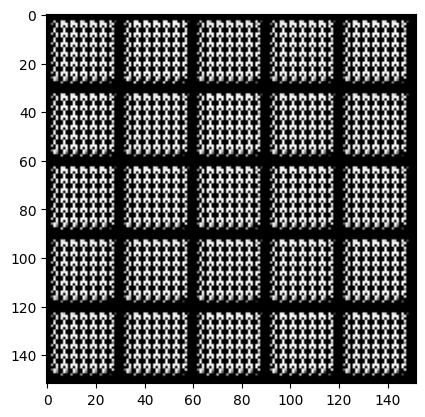

32


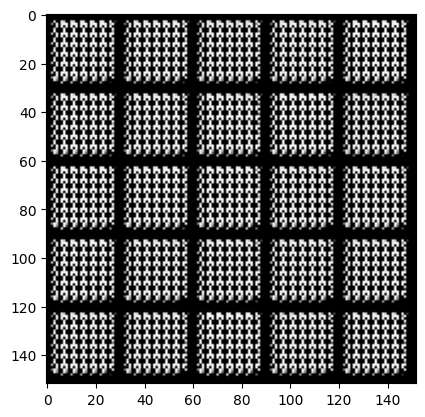

33


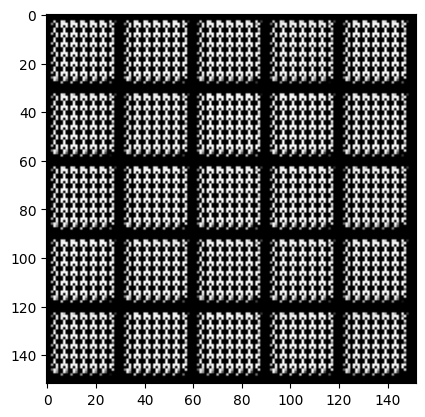

34


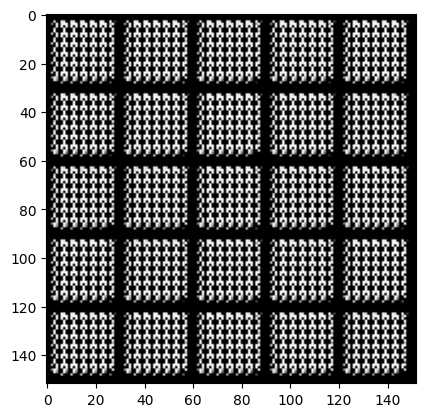

35


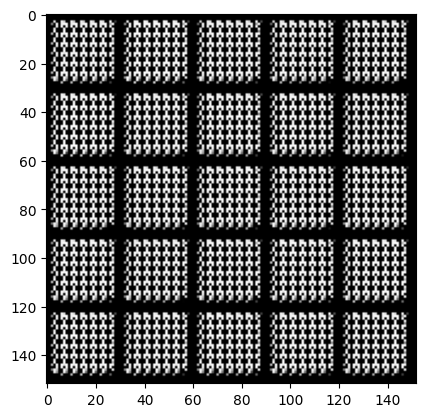

36


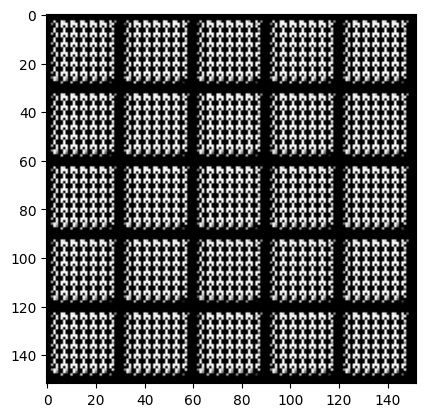

37


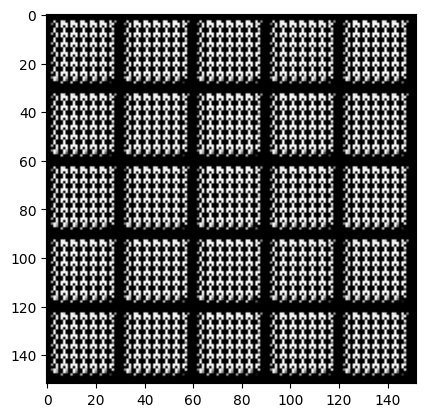

38


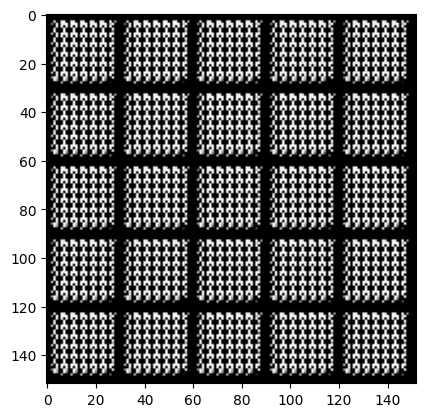

39


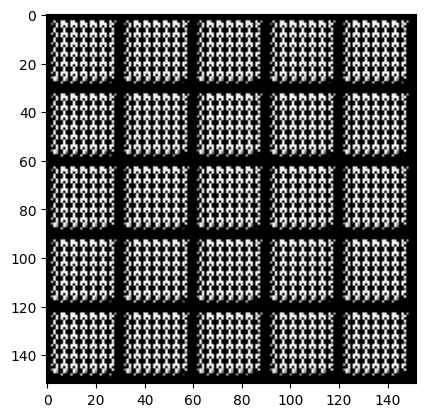

40


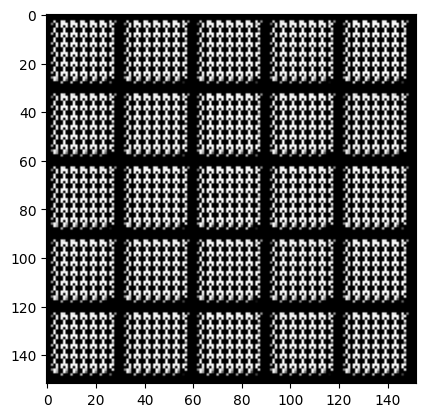

41


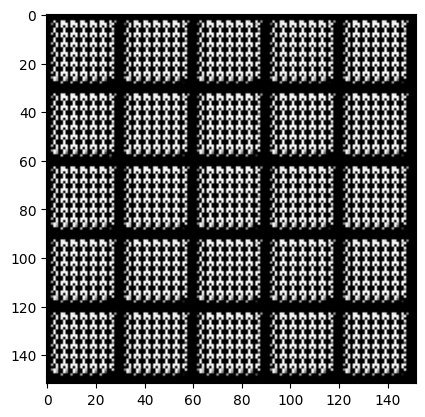

42


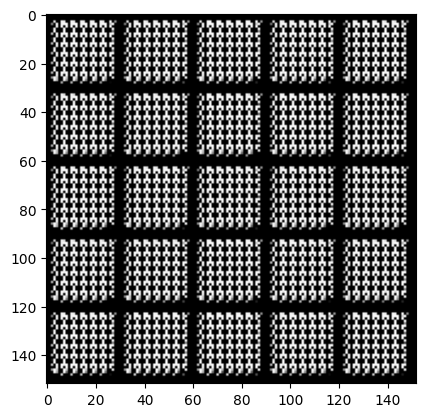

43


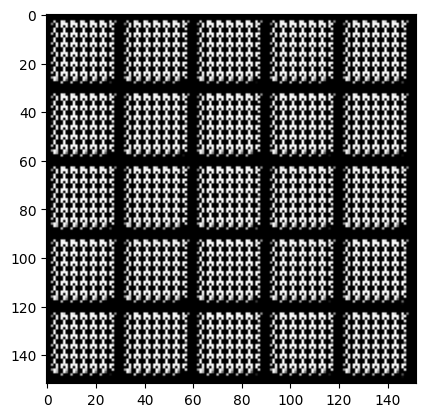

44


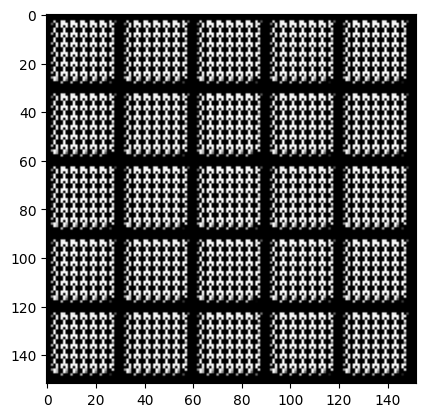

45


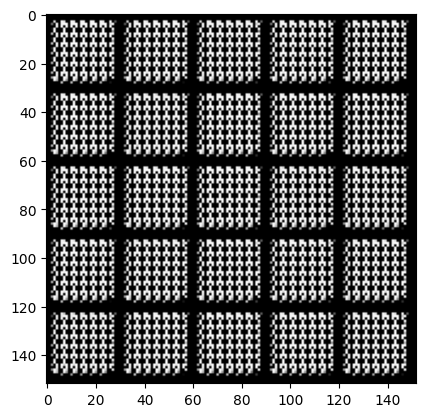

46


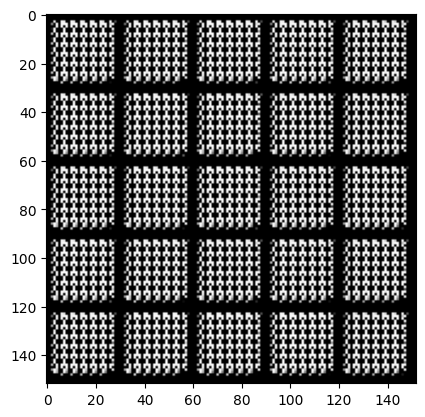

47


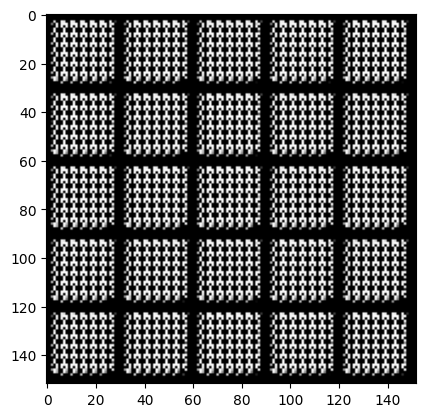

48


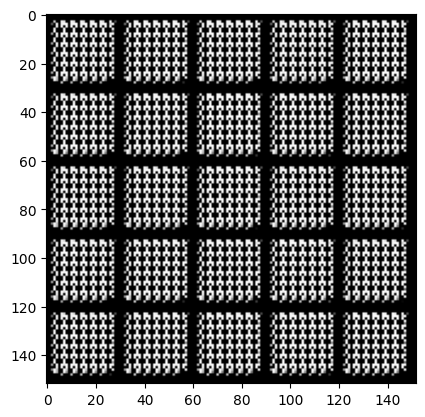

49


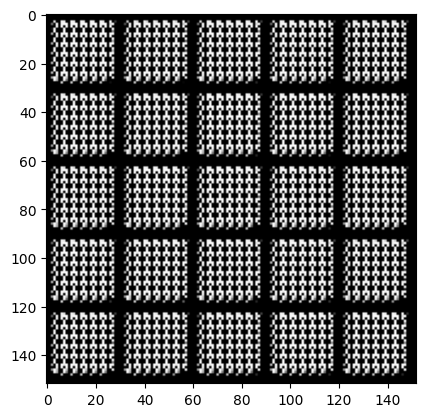

In [12]:
from glob import glob

for i in range(epoch):
  print(i)
  file_list=glob("./gen_{}_*.png".format(i))
  img_per_epoch=len(file_list)
  for idx,j in enumerate(file_list):
    img=plt.imread(j)
    plt.subplot(1,img_per_epoch,idx+1)
    plt.imshow(img)
  plt.show()